In [2]:
#%pip install -r work/requirements.txt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from matplotlib import pyplot as plt

In [3]:
file_name = "work/data/polished2.csv"

df = pd.read_csv(file_name)

<Axes: >

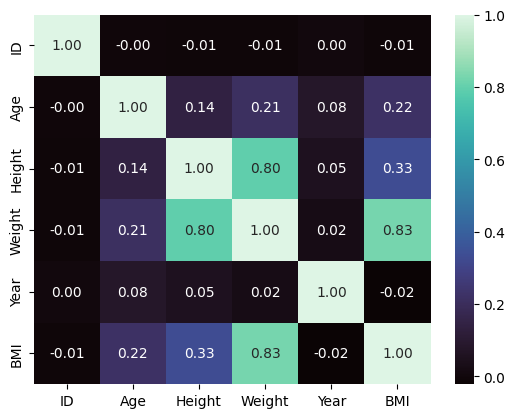

In [4]:
# matriz de correlação so das variaveis numericas
to_numeric_df = df.drop(df.columns[0], axis=1)
numeric_df = to_numeric_df.select_dtypes(include=['float64', 'int64'])
df_corr = numeric_df.corr()

sns.heatmap(df_corr, annot=True, fmt=".2f", cmap='mako')

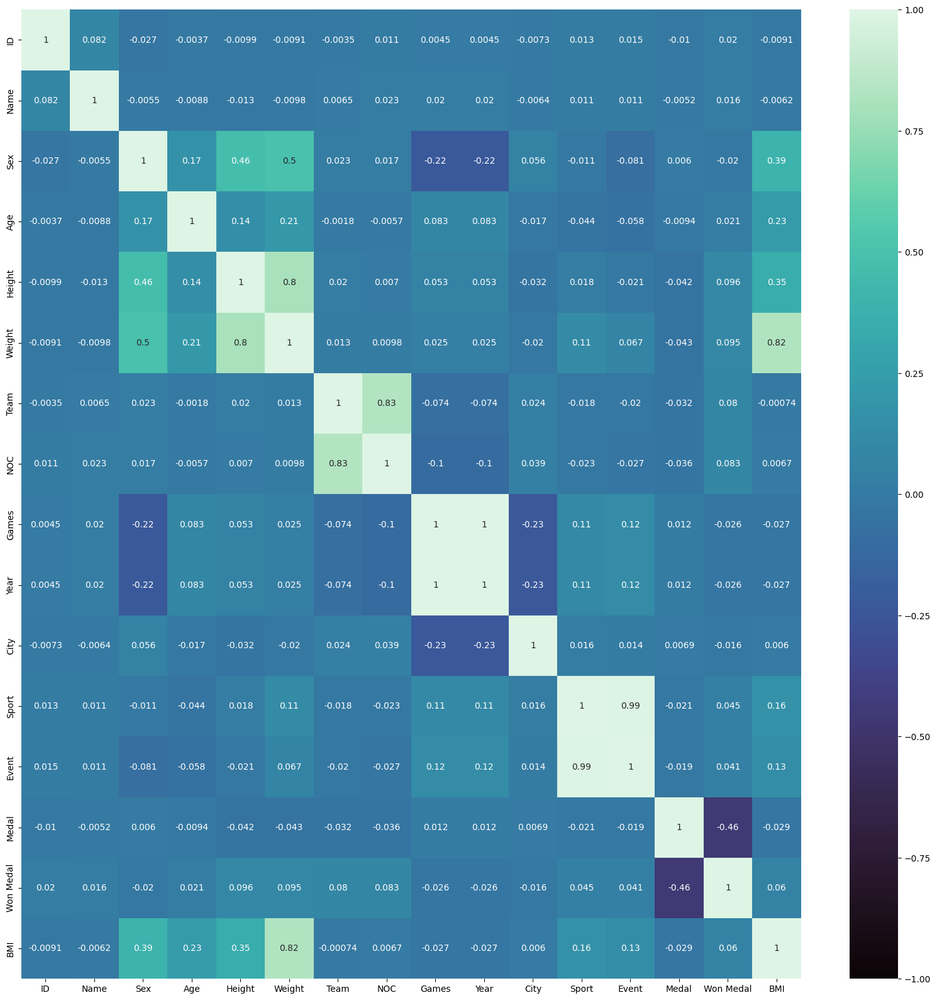

In [5]:
# Passar um encoder nos categoricos para conseguir comprar distribuições
encoders = {}
# remove Season column
to_encode_df = df.drop(df.columns[0], axis=1)
to_encode_df = to_encode_df.drop(columns='Season')

for columns in to_encode_df.columns:
    le = LabelEncoder()
    to_encode_df[columns] = le.fit_transform(to_encode_df[columns])
    encoders[columns] = le
    
corr_matrix = to_encode_df.corr()


plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, annot=True, cmap='mako', vmin=-1, vmax=1)
plt.show()

<Figure size 3000x3000 with 0 Axes>

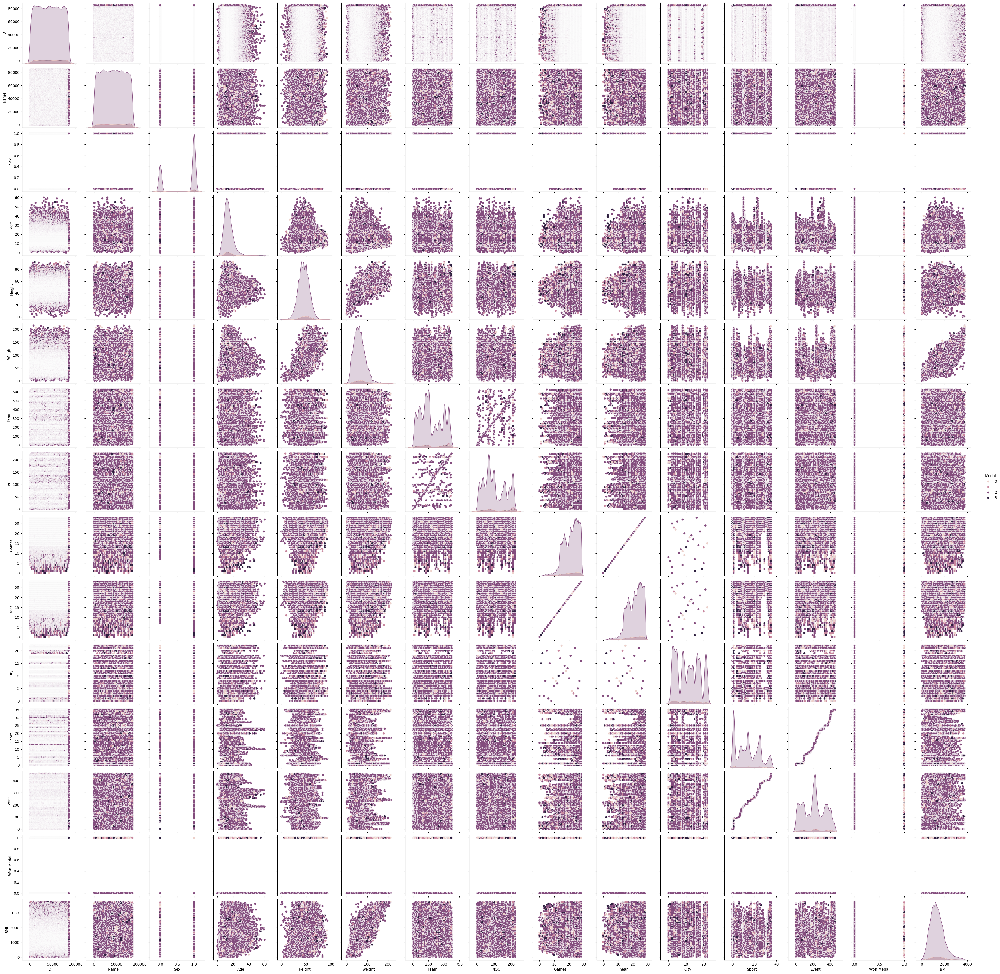

In [6]:
plt.figure(figsize=(30, 30))

sns.pairplot(to_encode_df, hue='Medal')

plt.show()